# Music recommendation based on genre, mode, tempo using ML pipeline, evaluation and Hyperparameter tuning

### Prepared by: Udita Bose <uditab@student.unimelb.edu.au>

In [3]:

# import numpy, pandas, graphs
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



In [4]:
# import scikit libraries
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier

from sklearn.svm import SVC
from sklearn.tree import (
    DecisionTreeClassifier,
    plot_tree
)

from sklearn.compose import ColumnTransformer

from sklearn.preprocessing import (
    LabelEncoder,
    OneHotEncoder,
    StandardScaler
)
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    precision_score,
    classification_report,
    ConfusionMatrixDisplay
)
from sklearn.model_selection import (
    # validation_curve,
    train_test_split,
    StratifiedKFold,
    # GridSearchCV
)
from sklearn.feature_selection import (
    mutual_info_classif,
    SelectKBest,
    f_classif,
    RFECV
)

from sklearn.pipeline import Pipeline

In [5]:
# import kagglehub
import kagglehub
from kagglehub import KaggleDatasetAdapter

/Users/scottwu/Documents/Code/AcademicProjects/Intro_to_ML_A02/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
# suppress all warning
import warnings
warnings.filterwarnings('ignore')

In [7]:
# load the dataset in a Panda DataFrame
all_music_data_df = kagglehub.dataset_load(
    KaggleDatasetAdapter.PANDAS,
    "vicsuperman/prediction-of-music-genre",
    "music_genre.csv"
)


### Initial Data Exploration

In [8]:
# first few rows
all_music_data_df.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894.0,Röyksopp,Röyksopp's Night Out,27.0,0.00468,0.652,-1.0,0.941,0.79200,A#,0.115,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652.0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,218293.0,0.890,0.95000,D,0.124,-7.043,Minor,0.0300,115.00200000000001,4-Apr,0.531,Electronic
2,30097.0,Dillon Francis,Hurricane,28.0,0.00306,0.620,215613.0,0.755,0.01180,G#,0.534,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177.0,Dubloadz,Nitro,34.0,0.02540,0.774,166875.0,0.700,0.00253,C#,0.157,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907.0,What So Not,Divide & Conquer,32.0,0.00465,0.638,222369.0,0.587,0.90900,F#,0.157,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic


In [9]:
# basic statistics
# all_music_data_df = all_music_data_df.drop(columns=["instance_id"])
all_music_data_df.head()
all_music_data_df.describe()

,instance_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,valence
count,50000.000000,50000.000000,50000.000000,50000.000000,5.000000e+04,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,55888.396360,44.220420,0.306383,0.558241,2.212526e+05,0.599755,0.181601,0.193896,-9.133761,0.093586,0.456264
std,20725.256253,15.542008,0.341340,0.178632,1.286720e+05,0.264559,0.325409,0.161637,6.162990,0.101373,0.247119
min,20002.000000,0.000000,0.000000,0.059600,-1.000000e+00,0.000792,0.000000,0.009670,-47.046000,0.022300,0.000000
25%,37973.500000,34.000000,0.020000,0.442000,1.748000e+05,0.433000,0.000000,0.096900,-10.860000,0.036100,0.257000
50%,55913.500000,45.000000,0.144000,0.568000,2.192810e+05,0.643000,0.000158,0.126000,-7.276500,0.048900,0.448000
75%,73863.250000,56.000000,0.552000,0.687000,2.686122e+05,0.815000,0.155000,0.244000,-5.173000,0.098525,0.648000
max,91759.000000,99.000000,0.996000,0.986000,4.830606e+06,0.999000,0.996000,1.000000,3.744000,0.942000,0.992000


In [10]:
# correlations existing in the raw data
all_correlation = all_music_data_df.corr(method="pearson", numeric_only=True)
print(f"Correlation of all data: \n{all_correlation}")

Correlation of all data: 
                  instance_id  popularity  acousticness  danceability  \
instance_id          1.000000    0.006317     -0.005268      0.000372   
popularity           0.006317    1.000000     -0.290453      0.356420   
acousticness        -0.005268   -0.290453      1.000000     -0.347681   
danceability         0.000372    0.356420     -0.347681      1.000000   
duration_ms         -0.005848   -0.083809      0.061862     -0.155507   
energy               0.009952    0.216345     -0.791250      0.263934   
instrumentalness    -0.004015   -0.364960      0.387970     -0.301277   
liveness             0.004737   -0.039468     -0.109220     -0.051465   
loudness             0.006847    0.317941     -0.730401      0.390859   
speechiness         -0.005908    0.224309     -0.163377      0.279767   
valence              0.005385    0.124913     -0.270238      0.434557   

                  duration_ms    energy  instrumentalness  liveness  loudness  \
instance_id     

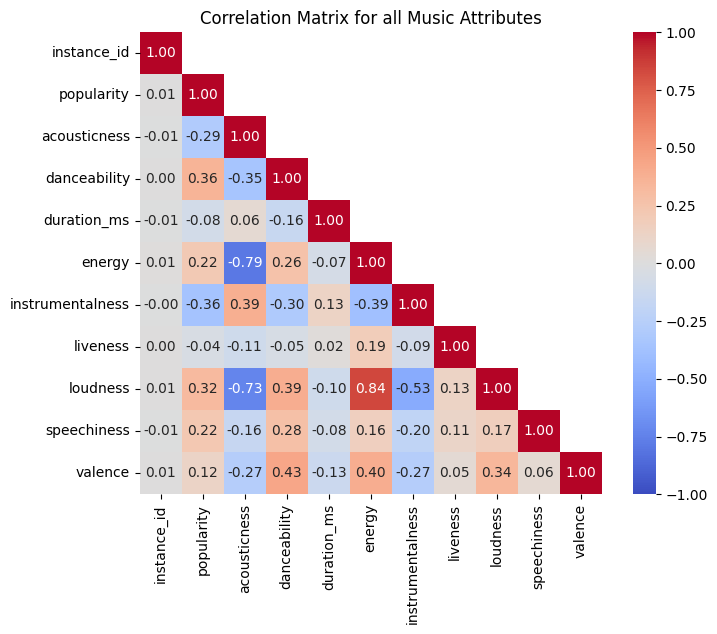

In [11]:
# correlation plotted
mask = np.triu(np.ones_like(all_correlation, dtype=float), k=1)
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(all_correlation, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1, square=True)
plt.title("Correlation Matrix for all Music Attributes")
plt.show()

In [12]:
# data shape
all_music_data_df.shape

(50005, 18)

In [13]:
# columns, and data types
all_music_data_df.dtypes

instance_id         float64
artist_name             str
track_name              str
popularity          float64
acousticness        float64
danceability        float64
duration_ms         float64
energy              float64
instrumentalness    float64
key                     str
liveness            float64
loudness            float64
mode                    str
speechiness         float64
tempo                   str
obtained_date           str
valence             float64
music_genre             str
dtype: object

In [14]:
# raw data per genre
all_music_data_df['music_genre'].value_counts()

music_genre
Electronic     5000
Anime          5000
Jazz           5000
Alternative    5000
Country        5000
Rap            5000
Blues          5000
Rock           5000
Classical      5000
Hip-Hop        5000
Name: count, dtype: int64

In [15]:
# unavailable data per feature
all_music_data_df.isna().sum()

instance_id         5
artist_name         5
track_name          5
popularity          5
acousticness        5
danceability        5
duration_ms         5
energy              5
instrumentalness    5
key                 5
liveness            5
loudness            5
mode                5
speechiness         5
tempo               5
obtained_date       5
valence             5
music_genre         5
dtype: int64

In [16]:
# unavailable data per feature
all_music_data_df['danceability'].value_counts()

danceability
0.5290    143
0.6570    139
0.6100    134
0.5540    133
0.4990    130
         ... 
0.0792      1
0.0832      1
0.0708      1
0.9860      1
0.9740      1
Name: count, Length: 1088, dtype: int64

In [17]:
# unique data for string columns
columns = ['key','mode','tempo']
for column in columns:
    print(f"    {column}: {all_music_data_df[column].unique()}")
    print()

    key: <StringArray>
['A#', 'D', 'G#', 'C#', 'F#', 'B', 'G', 'F', 'A', 'C', 'E', 'D#', nan]
Length: 13, dtype: str

    mode: <StringArray>
['Minor', 'Major', nan]
Length: 3, dtype: str

    tempo: <StringArray>
[           '100.889', '115.00200000000001',            '127.994',
            '128.014',            '145.036',                  '?',
            '149.995',            '120.008', '149.94799999999998',
            '139.933',
 ...
            '175.903',             '93.758',             '83.881',
            '128.194',            '138.964',            '129.939',
            '129.285',             '112.97',            '167.655',
  '99.20100000000001']
Length: 29395, dtype: str



In [18]:
# find any duplicated data
duplicated = all_music_data_df.duplicated()
print(f"duplicated : {all_music_data_df[duplicated]}")

duplicated :        instance_id artist_name track_name  popularity  acousticness  \
10001          NaN         NaN        NaN         NaN           NaN   
10002          NaN         NaN        NaN         NaN           NaN   
10003          NaN         NaN        NaN         NaN           NaN   
10004          NaN         NaN        NaN         NaN           NaN   

       danceability  duration_ms  energy  instrumentalness  key  liveness  \
10001           NaN          NaN     NaN               NaN  NaN       NaN   
10002           NaN          NaN     NaN               NaN  NaN       NaN   
10003           NaN          NaN     NaN               NaN  NaN       NaN   
10004           NaN          NaN     NaN               NaN  NaN       NaN   

       loudness mode  speechiness tempo obtained_date  valence music_genre  
10001       NaN  NaN          NaN   NaN           NaN      NaN         NaN  
10002       NaN  NaN          NaN   NaN           NaN      NaN         NaN  
10003       Na

In [19]:
only_mode_music = all_music_data_df[['track_name', 'mode', 'music_genre', 'popularity']]
only_mode_music.head()

,track_name,mode,music_genre,popularity
0,Röyksopp's Night Out,Minor,Electronic,27.0
1,The Shining Path,Minor,Electronic,31.0
2,Hurricane,Major,Electronic,28.0
3,Nitro,Major,Electronic,34.0
4,Divide & Conquer,Major,Electronic,32.0


## Visualize data

Text(0.5, 1.0, 'Counts in each mode')

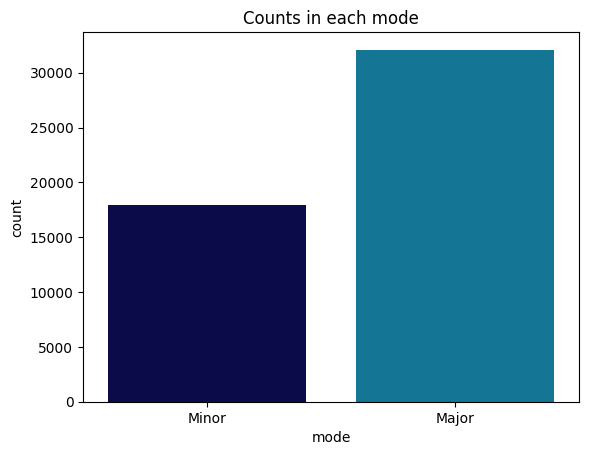

In [20]:
sns.countplot(x = 'mode', data = all_music_data_df, palette = "ocean", order = None)
plt.title(f"Counts in each mode")


All keys: <StringArray>
['A#', 'D', 'G#', 'C#', 'F#', 'B', 'G', 'F', 'A', 'C', 'E', 'D#', nan]
Length: 13, dtype: str



Text(0.5, 1.0, 'Counts in each key')

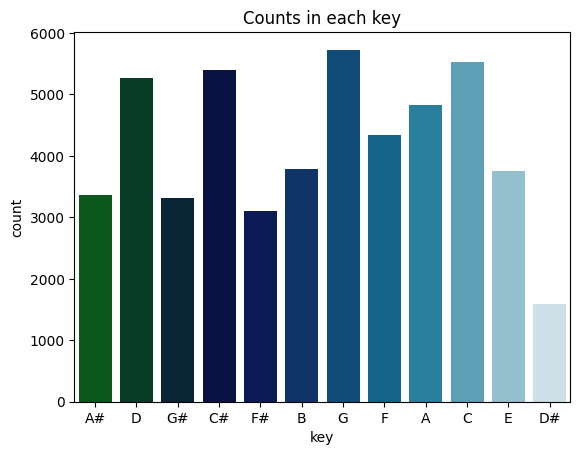

In [21]:
keys_of_music = all_music_data_df['key'].unique()
print(f"All keys: {keys_of_music}")
print()
sns.countplot(x = 'key', data = all_music_data_df, palette = "ocean", order = None)
plt.title(f"Counts in each key")

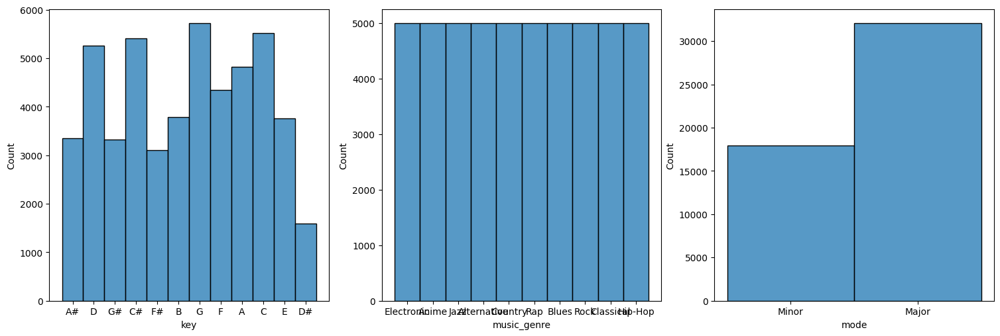

In [22]:
fig, axs = plt.subplots(ncols = 3, nrows = 1, figsize = (15, 5))
# fig.delaxes(axs[2][0])
index = 0

str_features = all_music_data_df[["key", "music_genre", "mode"]]

axs = axs.flatten()
for k, v in str_features.items():
    sns.histplot(v, ax = axs[index])
    index += 1
plt.tight_layout(pad = 0.4, w_pad = 0.5, h_pad = 5.0)

In [23]:
# numeric_features = all_music_data_df.drop(["key", "music_genre", "mode"], axis = 1)
# fig, axs = plt.subplots(ncols = 3, nrows = 4, figsize = (15, 15))
# fig.delaxes(axs[3][2])
# index = 0
#
# axs = axs.flatten()
# for k, v in numeric_features.items():
#     if index < 12:
#         sns.histplot(v, ax = axs[index])
#         index += 1
# plt.tight_layout(pad = 0.4, w_pad = 0.5, h_pad = 5.0)

## Preprocess Data

### Copy Data for future usages, and drop bad data

In [24]:
# copy the data
processed_df = all_music_data_df.copy()
print(f"Initial data shape: {processed_df.shape}")

Initial data shape: (50005, 18)


In [25]:
# drop rows with bad values, Thanks to Zed
bad_values = ['', ' ', '?' , -1 , '-1']
rows_to_drop = processed_df.isna() | processed_df.isin(bad_values)
processed_df = processed_df[~rows_to_drop.any(axis=1)]
print(f"Data shape after dropping bad data: {processed_df.shape}")

Data shape after dropping bad data: (40560, 18)


In [26]:
# drop duplicated rows, from Zed
duplicate_rows = processed_df.duplicated()
if duplicate_rows.sum() > 0:
    print(f"Duplicate rows: \n{processed_df[duplicate_rows]}")
    processed_df = processed_df.drop_duplicates().reset_index(drop=True)

print(f"Data shape after dropping duplicated data: {processed_df.shape}")

Data shape after dropping duplicated data: (40560, 18)


The basic pre-processing of the data has deleted
- 4 columns
- 9446 rows

### Encode the non-numeric features

In [27]:
# save the cleaned data
processed_df.to_csv("./ub_music_genre_cleaned.csv")

In [28]:
# find the non-numeric columns
str_features = processed_df.select_dtypes(include=['object', 'string']).columns.tolist()
print(f"Non-numeric features: {str_features}")

Non-numeric features: ['artist_name', 'track_name', 'key', 'mode', 'tempo', 'obtained_date', 'music_genre']


In [29]:
# encode all the non-numeric columns with LabelEncoder
encoder_list = []
encoded_df = processed_df.copy()
for sf in str_features:
    sf_encoder = LabelEncoder()
    encoded_df[sf] = sf_encoder.fit_transform(encoded_df[sf])
    encoder_list.append(sf_encoder)
    print(f"Label encoder for {sf}: {sf_encoder.classes_}")

Label encoder for artist_name: ['!!!' '"Weird Al" Yankovic' '$NOT' ... '楚神ウリエ(CV.近藤隆)' '鉤貫レム(CV.斉藤壮馬)'
 '黒崎真音']
Label encoder for track_name: ['"42" - From SR3MM' '"Blue Flame" (Interlude)' '"Boom"' ... '麗しき世界'
 '黒い弾丸' '黒い雫']
Label encoder for key: ['A' 'A#' 'B' 'C' 'C#' 'D' 'D#' 'E' 'F' 'F#' 'G' 'G#']
Label encoder for mode: ['Major' 'Minor']
Label encoder for tempo: ['100.0' '100.001' '100.00200000000001' ... '99.99700000000001'
 '99.99799999999999' '99.999']
Label encoder for obtained_date: ['1-Apr' '3-Apr' '4-Apr' '5-Apr']
Label encoder for music_genre: ['Alternative' 'Anime' 'Blues' 'Classical' 'Country' 'Electronic'
 'Hip-Hop' 'Jazz' 'Rap' 'Rock']


In [30]:
# print the shape of the data after encoding
print(f"Data shape after label encoding: {encoded_df.shape}")

Data shape after label encoding: (40560, 18)


In [31]:
# see the encoded data
encoded_df.describe()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
count,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,4.056000e+04,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000
mean,55874.826430,3327.289103,17231.600296,44.276677,0.305974,0.558418,2.454895e+05,0.600330,0.181603,5.346672,0.193820,-9.126369,0.359985,0.093738,13404.254315,1.918910,0.456921,4.505843
std,20731.018576,1914.425149,9947.161077,15.545617,0.341108,0.178652,1.101214e+05,0.264501,0.325710,3.461049,0.161501,6.154679,0.480002,0.101502,7990.532894,0.349147,0.246942,2.875219
min,20002.000000,0.000000,0.000000,0.000000,0.000000,0.059600,1.550900e+04,0.000792,0.000000,0.000000,0.009670,-47.046000,0.000000,0.022300,0.000000,0.000000,0.000000,0.000000
25%,37994.750000,1717.000000,8650.750000,34.000000,0.020000,0.442000,1.904800e+05,0.433000,0.000000,3.000000,0.097000,-10.843000,0.000000,0.036100,6579.000000,2.000000,0.259000,2.000000
50%,55899.500000,3290.000000,17188.500000,45.000000,0.144000,0.569000,2.275330e+05,0.644000,0.000157,5.000000,0.126000,-7.277000,0.000000,0.048900,12848.500000,2.000000,0.449000,5.000000
75%,73817.500000,5019.000000,25808.250000,56.000000,0.550000,0.687000,2.757600e+05,0.817000,0.152000,8.000000,0.244000,-5.174000,1.000000,0.098800,20613.250000,2.000000,0.648000,7.000000
max,91759.000000,6362.000000,34679.000000,99.000000,0.996000,0.986000,4.497994e+06,0.999000,0.996000,11.000000,1.000000,3.744000,1.000000,0.942000,27287.000000,3.000000,0.992000,9.000000


### One-hot encode the data

In [32]:
# columns for one-hot encoding
oh_encoded_df = encoded_df.copy()
oh_encoded_df.drop('music_genre', axis=1)

numerical_cols = oh_encoded_df.columns[oh_encoded_df.dtypes != object]
categorical_cols = oh_encoded_df.columns[oh_encoded_df.dtypes == object]

# scaling numeric data via StandardScaler
numeric_transformer = Pipeline(
    steps=[
        ('scaler', StandardScaler())
    ]
)

# encoding non-numerical (categorical) data via OneHotEncoding
categorical_transformer = Pipeline(
    steps=[
        ('onehot', OneHotEncoder(drop='if_binary'))
    ]
)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ]
)

oh_encoded_df = pd.DataFrame(preprocessor.fit_transform(oh_encoded_df))

print(f"Data sample after preprocessing: \n{oh_encoded_df.head()}")

Data sample after preprocessing: 
         0         1         2         3         4         5         6   \
0 -0.444886  1.215895  1.181397 -0.854057 -0.859781  0.355901 -0.246972   
1 -1.243458 -0.967033 -0.474372 -1.047040 -0.888042  0.344706 -0.271309   
2  0.304001 -0.910618  0.227847 -0.661074 -0.822549  1.206728 -0.713898   
3 -1.493810  1.412301 -1.008702 -0.789729 -0.883381  0.445462 -0.209957   
4 -0.584389 -0.280656 -1.191571  0.110857 -0.812288  0.076024 -0.282251   

         7         8         9         10        11        12        13  \
0  1.095173  2.359175 -0.100165 -0.432322  0.338506  1.333376 -0.627956   
1  0.584770 -0.521338  1.633435  2.106386  0.732682 -0.749976 -0.583621   
2  0.376829 -0.549799 -0.389098 -0.227987  0.752018 -0.749976  1.431139   
3 -0.050397  2.233294  1.055568 -0.227987  0.464753 -0.749976 -0.516627   
4  0.766247 -0.557543 -0.966965 -0.543778  0.785163 -0.749976  2.534577   

         14        15        16       17  
0 -1.188578  0.232254

In [33]:
print(f"Columns after preprocessing: \n{oh_encoded_df.columns}")

Columns after preprocessing: 
RangeIndex(start=0, stop=18, step=1)


In [34]:
print(f"Data shape after preprocessing: {oh_encoded_df.shape}")

Data shape after preprocessing: (40560, 18)


In [35]:
print(f"Basic statistics after preprocessing: \n{oh_encoded_df.describe()}")

Basic statistics after preprocessing: 
                 0             1             2             3             4   \
count  4.056000e+04  4.056000e+04  4.056000e+04  4.056000e+04  4.056000e+04   
mean   1.156209e-17  5.886153e-17 -1.401465e-17 -1.569641e-16 -6.727032e-17   
std    1.000012e+00  1.000012e+00  1.000012e+00  1.000012e+00  1.000012e+00   
min   -1.730415e+00 -1.738031e+00 -1.732335e+00 -2.848213e+00 -8.970130e-01   
25%   -8.624900e-01 -8.411449e-01 -8.626538e-01 -6.610740e-01 -8.383797e-01   
50%    1.190191e-03 -1.947820e-02 -4.332978e-03  4.652967e-02 -4.748535e-01   
75%    8.655096e-01  8.836761e-01  8.622315e-01  7.541334e-01  7.154017e-01   
max    1.730963e+00  1.585201e+00  1.754030e+00  3.520221e+00  2.022923e+00   

                 5             6             7             8             9   \
count  4.056000e+04  4.056000e+04  4.056000e+04  4.056000e+04  4.056000e+04   
mean   3.013150e-16 -1.149201e-16 -1.009055e-16  3.363516e-17 -8.689083e-17   
std    1.000

### Combined encoding for final processing output

In [36]:
# One-hot encoding for key, and mode
processed_df = pd.get_dummies(processed_df, columns=['key'], drop_first=True)
processed_df = pd.get_dummies(processed_df, columns=['mode'], drop_first=True)
processed_df = pd.get_dummies(processed_df, columns=['music_genre'], drop_first=True)

print(f"Data shape after one-hot encoding: \n{processed_df.shape}")
print(f"Data sample after one-hot encoding: \n{processed_df.head(10)}")

Data shape after one-hot encoding: 
(40560, 36)
Data sample after one-hot encoding: 
    instance_id           artist_name                   track_name  \
1       46652.0  Thievery Corporation             The Shining Path   
2       30097.0        Dillon Francis                    Hurricane   
3       62177.0              Dubloadz                        Nitro   
4       24907.0           What So Not             Divide & Conquer   
6       43760.0        Jordan Comolli                        Clash   
7       30738.0                Hraach                      Delirio   
8       84950.0                 Kayzo                  NEVER ALONE   
9       56950.0                Shlump                   Lazer Beam   
10      49030.0        Chase & Status  Lost & Not Found - Acoustic   
11      22654.0               G Jones                         Mind   

    popularity  acousticness  danceability  duration_ms  energy  \
1         31.0       0.01270         0.622     218293.0   0.890   
2         

In [37]:
print(f"Columns after one-hot encoding: \n{processed_df.columns}")

Columns after one-hot encoding: 
Index(['instance_id', 'artist_name', 'track_name', 'popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'obtained_date', 'valence', 'key_A#', 'key_B', 'key_C', 'key_C#',
       'key_D', 'key_D#', 'key_E', 'key_F', 'key_F#', 'key_G', 'key_G#',
       'mode_Minor', 'music_genre_Anime', 'music_genre_Blues',
       'music_genre_Classical', 'music_genre_Country',
       'music_genre_Electronic', 'music_genre_Hip-Hop', 'music_genre_Jazz',
       'music_genre_Rap', 'music_genre_Rock'],
      dtype='str')


After one-hot encoding, we have 18 more columns

In [38]:
# convert tempo to numeric
processed_df['tempo'] = processed_df['tempo'].astype(float, errors = 'ignore')
print(f"Tempo data after one-hot encoding: \n{processed_df['tempo'].head(10)}")

Tempo data after one-hot encoding: 
1     115.002
2     127.994
3     128.014
4     145.036
6     149.995
7     120.008
8     149.948
9     139.933
10     57.528
11    178.543
Name: tempo, dtype: float64


In [39]:
# bin tempo
tempo_bins = [30, 95, 120, 140, 200]
tempo_labels = ['Low', 'Comfortable', 'High', 'Piercing']
processed_df['tempo_group'] = pd.cut(
    processed_df['tempo'], bins=tempo_bins, labels=tempo_labels, right=False)
print(f"Tempo data after one-hot encoding: \n{processed_df['tempo_group'].head(10)}")

Tempo data after one-hot encoding: 
1     Comfortable
2            High
3            High
4        Piercing
6        Piercing
7            High
8        Piercing
9            High
10            Low
11       Piercing
Name: tempo_group, dtype: category
Categories (4, str): ['Low' < 'Comfortable' < 'High' < 'Piercing']


In [40]:
# more view into tempo groups
processed_df['tempo_group'].value_counts()

tempo_group
Piercing       10490
Comfortable    10404
Low            10306
High            9157
Name: count, dtype: int64

In [41]:
# Scalar transform all numeric data
# numerical_cols = processed_df.columns[processed_df.dtypes != object]
# num_scaler = StandardScaler()
# processed_df = pd.DataFrame(num_scaler.fit_transform(processed_df))
#
# print(f"Data shape after scaling numeric: \n{processed_df.shape}")
# print(f"Data sample after scaling numeric: \n{processed_df.head(10)}")

In [42]:
# save the final pre-processed data in a separate CSV
processed_df.to_csv("./ub_music_genre_cleaned_preprepped_v2.csv")

### Visualize pre-processed data

In [43]:
# data after clean up
processed_df.describe()

,instance_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,40560.000000,40560.000000,40560.000000,40560.000000,4.056000e+04,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000,40560.000000
mean,55874.826430,44.276677,0.305974,0.558418,2.454895e+05,0.600330,0.181603,0.193820,-9.126369,0.093738,119.874523,0.456921
std,20731.018576,15.545617,0.341108,0.178652,1.101214e+05,0.264501,0.325710,0.161501,6.154679,0.101502,30.653215,0.246942
min,20002.000000,0.000000,0.000000,0.059600,1.550900e+04,0.000792,0.000000,0.009670,-47.046000,0.022300,34.347000,0.000000
25%,37994.750000,34.000000,0.020000,0.442000,1.904800e+05,0.433000,0.000000,0.097000,-10.843000,0.036100,94.893000,0.259000
50%,55899.500000,45.000000,0.144000,0.569000,2.275330e+05,0.644000,0.000157,0.126000,-7.277000,0.048900,119.755500,0.449000
75%,73817.500000,56.000000,0.550000,0.687000,2.757600e+05,0.817000,0.152000,0.244000,-5.174000,0.098800,140.344000,0.648000
max,91759.000000,99.000000,0.996000,0.986000,4.497994e+06,0.999000,0.996000,1.000000,3.744000,0.942000,220.276000,0.992000


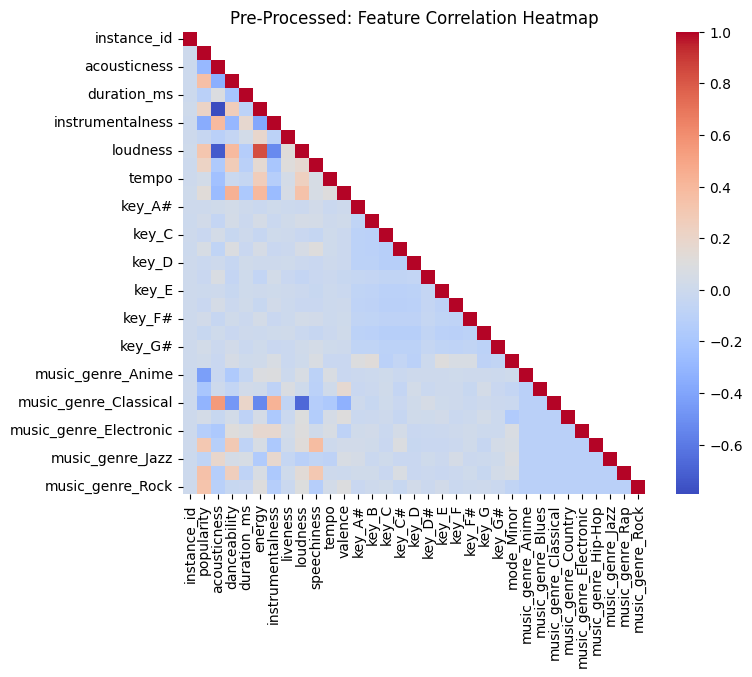

In [44]:
# view new correlation matrix
processed_corr = processed_df.corr(numeric_only=True)

# create the heatmap
mask = np.triu(np.ones_like(processed_corr, dtype=float), k=1)

plt.figure(figsize=(8, 6))
sns.heatmap(processed_corr, mask=mask, cmap='coolwarm', annot=False, square=True)
plt.title('Pre-Processed: Feature Correlation Heatmap')
plt.show()

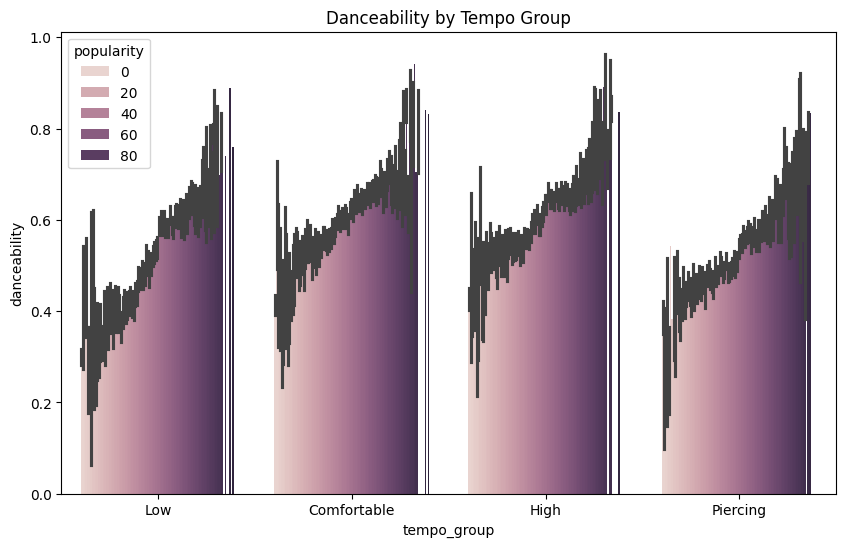

In [45]:
# tempo vs popularity
plt.figure(figsize=(10, 6))
# https://seaborn.pydata.org/generated/seaborn.barplot.html
sns.barplot(data=processed_df, x='tempo_group', y='danceability', hue="popularity")
ax.set_xticks(())
ax.set_yticks(())
plt.title('Danceability by Tempo Group')
plt.show()

## Combine features

In [46]:
# combine highly correlated features into one
# reduce dimensionality

# remove the columns that won't be used for any prediction
processed_df = processed_df.drop(columns=['instance_id', 'obtained_date'])
print(f"Data shape after dropping columns: {processed_df.shape}")

# millisecond duration is converted to minutes, and dropped
processed_df['duration_min'] = processed_df['duration_ms'] / 60000
processed_df = processed_df.drop(columns=['duration_ms'])

# energy and danceability are merged
processed_df['energy_danceability'] = processed_df['energy'] * processed_df['danceability']

# energy and valence are merged
processed_df['energy_valence'] = processed_df['energy'] * processed_df['valence']

# acousticness and instrumentalness are merged
processed_df['acoustic_instrumental'] = processed_df['acousticness'] * processed_df['instrumentalness']

# drop tempo, and keep the tempo_group
processed_df = processed_df.dropna(subset=['tempo']).reset_index(drop=True)

# print the latest data
processed_df.head(10)

Data shape after dropping columns: (40560, 35)


,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,...,music_genre_Electronic,music_genre_Hip-Hop,music_genre_Jazz,music_genre_Rap,music_genre_Rock,tempo_group,duration_min,energy_danceability,energy_valence,acoustic_instrumental
0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,0.890,0.950000,0.1240,-7.043,0.0300,...,True,False,False,False,False,Comfortable,3.638217,0.553580,0.472590,1.206500e-02
1,Dillon Francis,Hurricane,28.0,0.00306,0.620,0.755,0.011800,0.5340,-4.617,0.0345,...,True,False,False,False,False,High,3.593550,0.468100,0.251415,3.610800e-05
2,Dubloadz,Nitro,34.0,0.02540,0.774,0.700,0.002530,0.1570,-4.498,0.2390,...,True,False,False,False,False,High,2.781250,0.541800,0.189000,6.426200e-05
3,What So Not,Divide & Conquer,32.0,0.00465,0.638,0.587,0.909000,0.1570,-6.266,0.0413,...,True,False,False,False,False,Piercing,3.706150,0.374506,0.189601,4.226850e-03
4,Jordan Comolli,Clash,46.0,0.02890,0.572,0.803,0.000008,0.1060,-4.294,0.3510,...,True,False,False,False,False,Piercing,3.573467,0.459316,0.184690,2.236860e-07
5,Hraach,Delirio,43.0,0.02970,0.809,0.706,0.903000,0.0635,-9.339,0.0484,...,True,False,False,False,False,High,6.935533,0.571154,0.537266,2.681910e-02
6,Kayzo,NEVER ALONE,39.0,0.00299,0.509,0.921,0.000276,0.1780,-3.175,0.2680,...,True,False,False,False,False,Piercing,4.880000,0.468789,0.251433,8.252400e-07
7,Shlump,Lazer Beam,22.0,0.00934,0.578,0.731,0.011200,0.1110,-7.091,0.1730,...,True,False,False,False,False,High,3.413333,0.422518,0.148393,1.046080e-04
8,Chase & Status,Lost & Not Found - Acoustic,30.0,0.85500,0.607,0.158,0.000000,0.1060,-13.787,0.0345,...,True,False,False,False,False,Low,2.841050,0.095906,0.048506,0.000000e+00
9,G Jones,Mind,27.0,0.03370,0.513,0.828,0.569000,0.1090,-5.439,0.0609,...,True,False,False,False,False,Piercing,2.752200,0.424764,0.048935,1.917530e-02


In [47]:
# drop duplicates based on track & artist name
processed_df = processed_df.drop_duplicates(subset=['artist_name', 'track_name'], keep='last')
print(f" Shape after dropping duplicate track and artist: {processed_df.shape}")

 Shape after dropping duplicate track and artist: (37967, 38)


In [48]:
processed_df.head(10)

,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,...,music_genre_Electronic,music_genre_Hip-Hop,music_genre_Jazz,music_genre_Rap,music_genre_Rock,tempo_group,duration_min,energy_danceability,energy_valence,acoustic_instrumental
0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,0.890,0.950000,0.1240,-7.043,0.0300,...,True,False,False,False,False,Comfortable,3.638217,0.553580,0.472590,1.206500e-02
1,Dillon Francis,Hurricane,28.0,0.00306,0.620,0.755,0.011800,0.5340,-4.617,0.0345,...,True,False,False,False,False,High,3.593550,0.468100,0.251415,3.610800e-05
2,Dubloadz,Nitro,34.0,0.02540,0.774,0.700,0.002530,0.1570,-4.498,0.2390,...,True,False,False,False,False,High,2.781250,0.541800,0.189000,6.426200e-05
3,What So Not,Divide & Conquer,32.0,0.00465,0.638,0.587,0.909000,0.1570,-6.266,0.0413,...,True,False,False,False,False,Piercing,3.706150,0.374506,0.189601,4.226850e-03
4,Jordan Comolli,Clash,46.0,0.02890,0.572,0.803,0.000008,0.1060,-4.294,0.3510,...,True,False,False,False,False,Piercing,3.573467,0.459316,0.184690,2.236860e-07
5,Hraach,Delirio,43.0,0.02970,0.809,0.706,0.903000,0.0635,-9.339,0.0484,...,True,False,False,False,False,High,6.935533,0.571154,0.537266,2.681910e-02
6,Kayzo,NEVER ALONE,39.0,0.00299,0.509,0.921,0.000276,0.1780,-3.175,0.2680,...,True,False,False,False,False,Piercing,4.880000,0.468789,0.251433,8.252400e-07
7,Shlump,Lazer Beam,22.0,0.00934,0.578,0.731,0.011200,0.1110,-7.091,0.1730,...,True,False,False,False,False,High,3.413333,0.422518,0.148393,1.046080e-04
8,Chase & Status,Lost & Not Found - Acoustic,30.0,0.85500,0.607,0.158,0.000000,0.1060,-13.787,0.0345,...,True,False,False,False,False,Low,2.841050,0.095906,0.048506,0.000000e+00
9,G Jones,Mind,27.0,0.03370,0.513,0.828,0.569000,0.1090,-5.439,0.0609,...,True,False,False,False,False,Piercing,2.752200,0.424764,0.048935,1.917530e-02


In [49]:
# save the final cleaned data
processed_df.to_csv("./ub_music_genre_final_v3.csv")

## Model, and fitting data

In [50]:
# _TARGET = "popularity"
_TARGET = "tempo_group"
_NN_count = 5
_RANDOM_STATE = 42

In [51]:

model_map = {
    "Nearest Neighbors": KNeighborsClassifier(_NN_count),  # KNN with 5 neighbours
    "Linear SVM": SVC(kernel="linear", C=0.025, random_state=_RANDOM_STATE),
    "Logistic Regression": LogisticRegression(),
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(max_depth=_NN_count, random_state=_RANDOM_STATE),
    "Random Forest": RandomForestClassifier(
        max_depth=_NN_count, n_estimators=10, max_features=1, random_state=_RANDOM_STATE
    ),  # ensemble method
    "Neural Net":  MLPClassifier(alpha=1, max_iter=400, random_state=_RANDOM_STATE),  # neural net
}

In [52]:
# copy the processed data for before feature selection and test train split
transformed_df = processed_df.copy()

# drop artist name and track name
transformed_df.drop(columns=['artist_name', 'track_name'], inplace=True)

transformed_df.head()

,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,music_genre_Electronic,music_genre_Hip-Hop,music_genre_Jazz,music_genre_Rap,music_genre_Rock,tempo_group,duration_min,energy_danceability,energy_valence,acoustic_instrumental
0,31.0,0.01270,0.622,0.890,0.950000,0.124,-7.043,0.0300,115.002,0.531,...,True,False,False,False,False,Comfortable,3.638217,0.553580,0.472590,1.206500e-02
1,28.0,0.00306,0.620,0.755,0.011800,0.534,-4.617,0.0345,127.994,0.333,...,True,False,False,False,False,High,3.593550,0.468100,0.251415,3.610800e-05
2,34.0,0.02540,0.774,0.700,0.002530,0.157,-4.498,0.2390,128.014,0.270,...,True,False,False,False,False,High,2.781250,0.541800,0.189000,6.426200e-05
3,32.0,0.00465,0.638,0.587,0.909000,0.157,-6.266,0.0413,145.036,0.323,...,True,False,False,False,False,Piercing,3.706150,0.374506,0.189601,4.226850e-03
4,46.0,0.02890,0.572,0.803,0.000008,0.106,-4.294,0.3510,149.995,0.230,...,True,False,False,False,False,Piercing,3.573467,0.459316,0.184690,2.236860e-07


In [53]:
# split the dataset in 80% train, 20% test
# following the naming convention for data for model
##  y = target label
##  X = feature labels
le = LabelEncoder()

y = transformed_df[_TARGET]
y = pd.DataFrame(le.fit_transform(y)).values.ravel()
X = transformed_df.drop(_TARGET, axis=1)
X.drop(columns=['tempo'], inplace=True)

se = StandardScaler()
numerical_cols = X.columns[X.dtypes != object]

# split data to test and train
X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.8, test_size=0.2, stratify=y, random_state=_RANDOM_STATE
)

X_train_scaled = X_train
X_test_scaled = X_test
X_train_scaled[numerical_cols] = se.fit_transform(X_train[numerical_cols])
X_test_scaled[numerical_cols] = se.transform(X_test[numerical_cols])
X_train_selected = X_train_scaled[numerical_cols]
X_test_selected = X_test_scaled[numerical_cols]


print(f"Test data shape: {X_test.shape} : \n{X_test.head()}")
print("-----------------------------------------------------")
print(f"Train data shape: {X_train.shape} : \n{X_train.head()}")

Test data shape: (7594, 34) : 
       popularity  acousticness  danceability    energy  instrumentalness  \
5866    -1.514149      1.394340     -1.049861 -0.868133          2.205498   
14986    0.677654     -0.909015     -0.708679  1.353450         -0.570598   
21420    0.613189      0.371223      1.041976  0.475236         -0.573464   
5053    -0.547177     -0.904234     -0.468174  1.319959         -0.573464   
32603   -0.418248      1.917459     -2.179676 -2.084236          2.392370   

       liveness  loudness  speechiness   valence    key_A#  ...  \
5866  -0.527636 -1.070317    -0.415128 -1.119160 -0.268189  ...   
14986 -0.140367  0.778435    -0.480163  0.443062 -0.268189  ...   
21420 -0.275604  0.754938    -0.194619  1.872415 -0.268189  ...   
5053   0.695641  1.045468    -0.231201  1.195989 -0.268189  ...   
32603 -0.460017 -2.922084    -0.529956 -1.686472 -0.268189  ...   

       music_genre_Country  music_genre_Electronic  music_genre_Hip-Hop  \
5866             -0.331911  

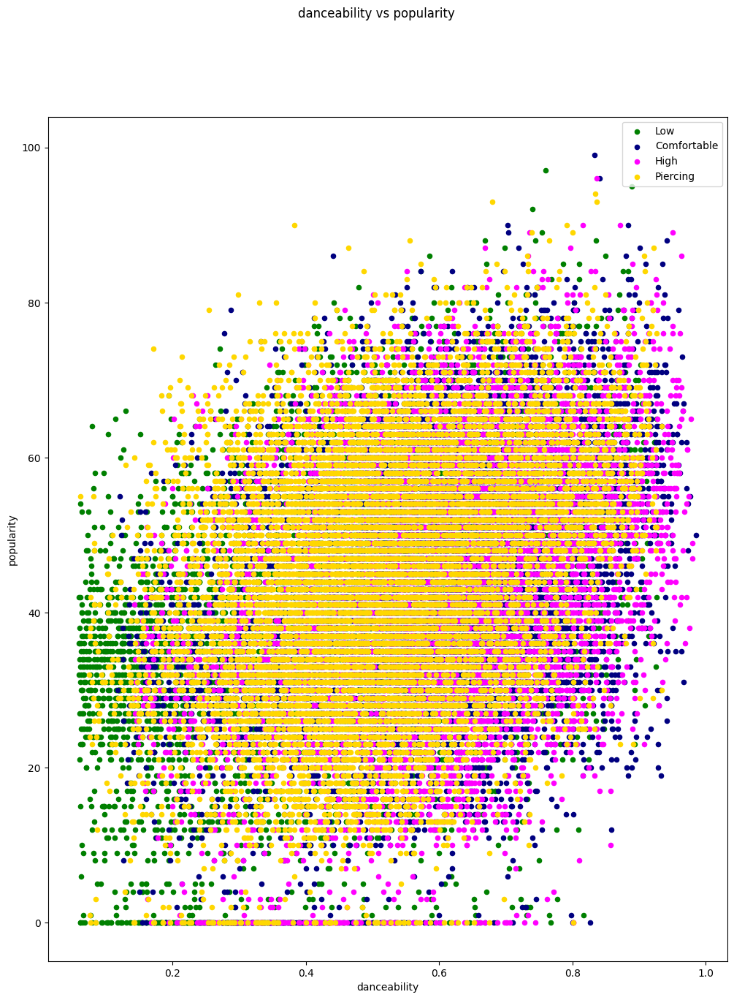

In [54]:
# display data grouped by tempo_group
fig, ax = plt.subplots(figsize=(12, 15))
colors = ['green', 'Navy', 'magenta', 'gold']

i = 0
for tg, data in transformed_df.groupby('tempo_group'):
    data.plot(kind='scatter', x='danceability', y='popularity', label=tg, color=colors[i], ax=ax)
    i = i + 1

# sns.scatterplot(data=processed_df, x='tempo_group', y='valence')
ax.set(xlabel='danceability', ylabel='popularity')
fig.suptitle('danceability vs popularity')
plt.show()

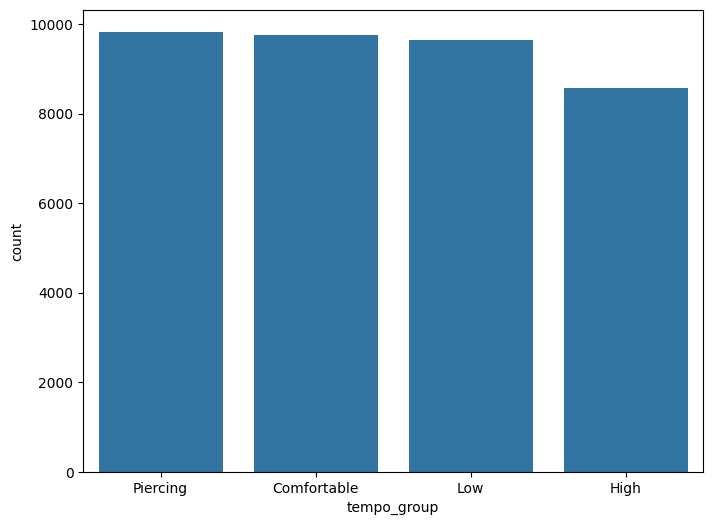

In [55]:
fig, ax = plt.subplots(figsize=(8, 6))
# sns.countplot(processed_df, hue="tempo_group", x="danceability",  stat="probability")
sns.countplot(data=processed_df, x='tempo_group', order=processed_df['tempo_group'].value_counts().index)

plt.show()


Baseline: Dummy Classifier
Baseline: Dummy Classifier : 25.65
Accuracy: 0.25651830392415065
3    2022
0    1945
2    1869
1    1713
4      45
Name: count, dtype: int64
Baseline: Dummy Classifier : Confusion Matrix:

[[534 418 489 496  12]
 [447 382 390 483  11]
 [464 469 490 492  12]
 [487 435 492 542  10]
 [ 13   9   8   9   0]]
              precision    recall  f1-score   support

           0       0.27      0.27      0.27      1949
           1       0.22      0.22      0.22      1713
           2       0.26      0.25      0.26      1927
           3       0.27      0.28      0.27      1966
           4       0.00      0.00      0.00        39

    accuracy                           0.26      7594
   macro avg       0.21      0.21      0.21      7594
weighted avg       0.26      0.26      0.26      7594

--------------------------------------------------------


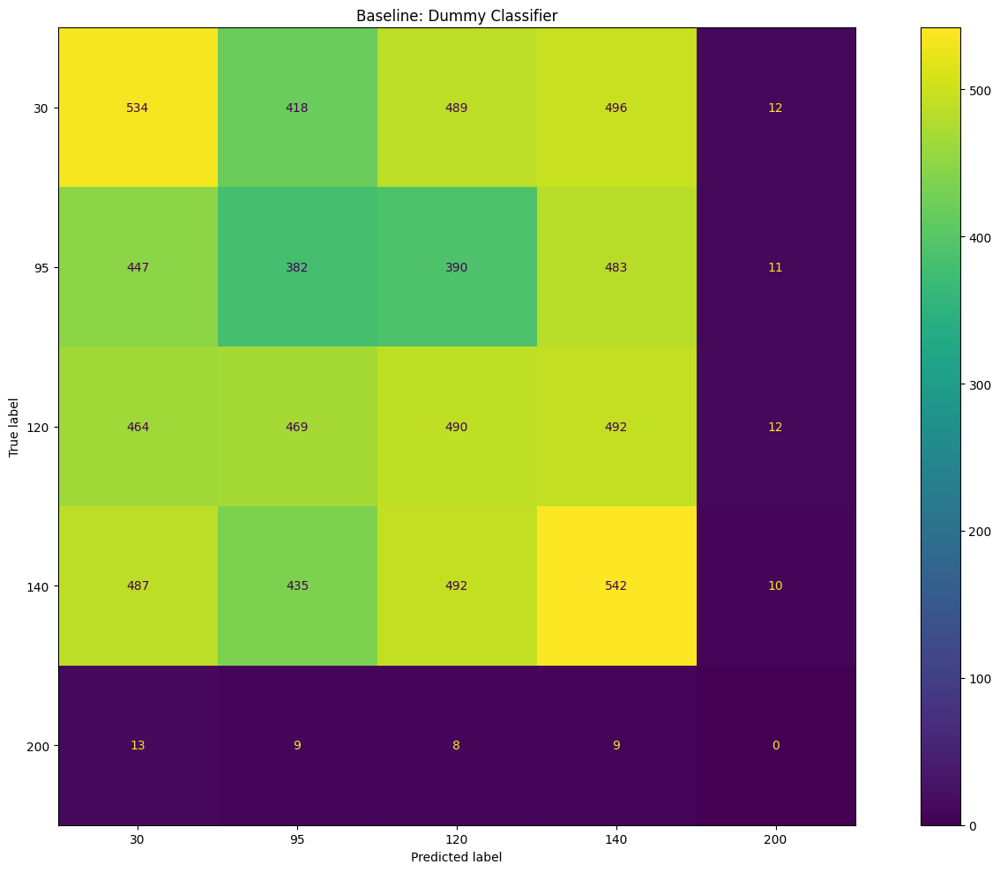

In [56]:
# A dummy classifier, just to set a baseline
dummy_clf = DummyClassifier(strategy="stratified", random_state=_RANDOM_STATE)
dummy_clf.fit(X_train, y_train)
predicted_y = dummy_clf.predict(X_test)

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15,10))

print(f"Baseline: Dummy Classifier")
print(f"Baseline: Dummy Classifier : {round(dummy_clf.score(X_test, y_test) * 100, 2)}")
print(f"Accuracy: {accuracy_score(y_test, predicted_y)}")
print(pd.Series(predicted_y).value_counts())
cm = confusion_matrix(y_test, predicted_y)
print("Baseline: Dummy Classifier : Confusion Matrix:\n")
print(cm)
print(classification_report(y_test, predicted_y))
print("--------------------------------------------------------")

ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=tempo_bins).plot(ax=axes)
axes.set_title(f"Baseline: Dummy Classifier")

plt.tight_layout()
plt.show()

In [57]:
#X.iloc[:, 0].max()
# x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
# y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

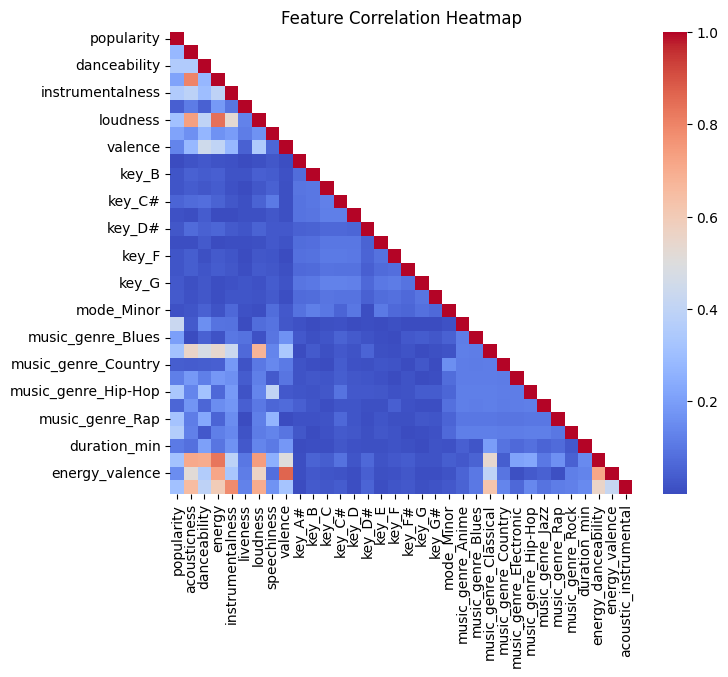

In [58]:
# Correlation matrix to explore target, from Pumi
feature_corr_matrix = X.corr().abs()

mask = np.triu(np.ones_like(feature_corr_matrix, dtype=float), k=1)

plt.figure(figsize=(8, 6))
sns.heatmap(feature_corr_matrix, mask=mask, cmap='coolwarm', annot=False, square=True)
plt.title('Feature Correlation Heatmap')
plt.show()

In [59]:
# Mutual info

# discrete/categorical features
discrete_features = X.columns.str.startswith(('key_', 'mode_', 'music_'))
mutual_info_all = mutual_info_classif(
    X, y,
    discrete_features=discrete_features,
    random_state=_RANDOM_STATE
)
mutual_info_all = pd.Series(mutual_info_all)
mutual_info_all.index = X.columns
mutual_info_all.sort_values(ascending=False, inplace=True)

print(f"Mutual info on whole data: \n{mutual_info_all}")

Mutual info on whole data: 
energy_danceability       0.053903
danceability              0.053808
energy                    0.042446
acousticness              0.040898
loudness                  0.037778
energy_valence            0.037234
speechiness               0.024257
acoustic_instrumental     0.022931
valence                   0.022677
music_genre_Classical     0.016349
duration_min              0.011809
instrumentalness          0.010505
music_genre_Jazz          0.006640
music_genre_Electronic    0.006138
music_genre_Anime         0.002475
music_genre_Rock          0.001350
music_genre_Country       0.001146
music_genre_Blues         0.001142
popularity                0.001023
liveness                  0.000713
music_genre_Hip-Hop       0.000657
music_genre_Rap           0.000368
mode_Minor                0.000288
key_A#                    0.000275
key_C#                    0.000155
key_D#                    0.000138
key_G                     0.000123
key_C                     0

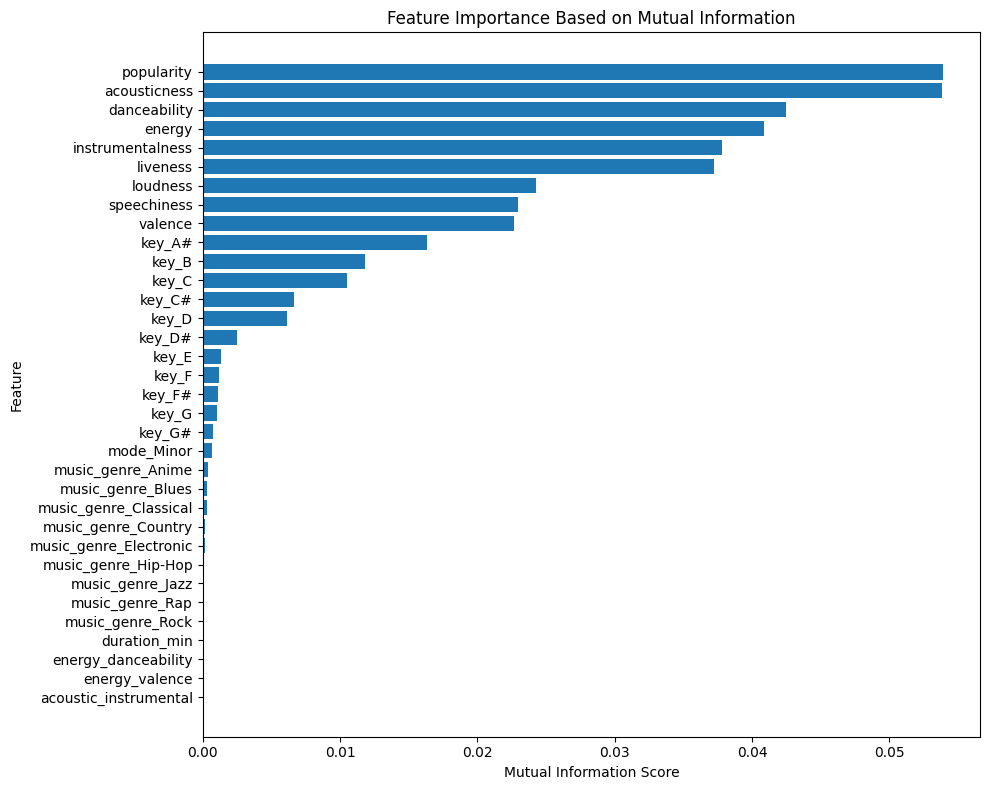

In [60]:
mi_df = pd.DataFrame({
    'Feature': X.columns,
    'MI Score': mutual_info_all
})

mi_df = mi_df.sort_values(by='MI Score', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(mi_df['Feature'], mi_df['MI Score'])

plt.xlabel("Mutual Information Score")
plt.ylabel("Feature")
plt.title("Feature Importance Based on Mutual Information")

plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [61]:
# select feature by k-fold, for the classifiers
# ref: https://medium.com/@agdop.mi/feature-engineering-and-selection-with-scikit-learn-fe5d3c737147

le = LabelEncoder()

clf_selector = SelectKBest(score_func=f_classif, k=5)
new_transformed_df = transformed_df.copy()
encoded_target = pd.DataFrame(le.fit_transform(new_transformed_df[_TARGET]))
new_transformed_df[_TARGET] = encoded_target
new_transformed_df.drop(columns=['tempo'], inplace=True)
new_transformed_df = new_transformed_df.dropna()

clf_selector_df = clf_selector.fit_transform(
    new_transformed_df, new_transformed_df[_TARGET])
# print(new_transformed_df[_TARGET])
# print(f"Selected support: {clf_selector.get_support()}")

clf_selected_features = new_transformed_df.columns[clf_selector.get_support()]
print()
print(f" Selected features: {clf_selected_features}")
print()


 Selected features: Index(['acousticness', 'music_genre_Electronic', 'music_genre_Jazz',
       'music_genre_Rock', 'tempo_group'],
      dtype='str')



### Feature selection with K-folds

In [62]:
transformed_df.shape

(37967, 36)

In [63]:
## RFE to select feature
# Ref: https://scikit-learn.org/stable/auto_examples/feature_selection/plot_rfe_with_cross_validation.html#sphx-glr-auto-examples-feature-selection-plot-rfe-with-cross-validation-py

min_features_to_select = 1 # Minimum number of features to consider
clf = LogisticRegression(max_iter=500)
cv = StratifiedKFold(10)

rfecv = RFECV(
    estimator=clf,
    step=1,
    cv=cv,
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
    n_jobs=2,
)
rfecv.fit(X_train_scaled, y_train)

print(f"Optimal number of features: {rfecv.n_features_}")


Optimal number of features: 32


In [64]:
# view the features
print(f"The optimal feature set: {rfecv.support_}")

The optimal feature set: [ True  True  True  True  True  True  True  True  True  True False  True
  True False  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True]


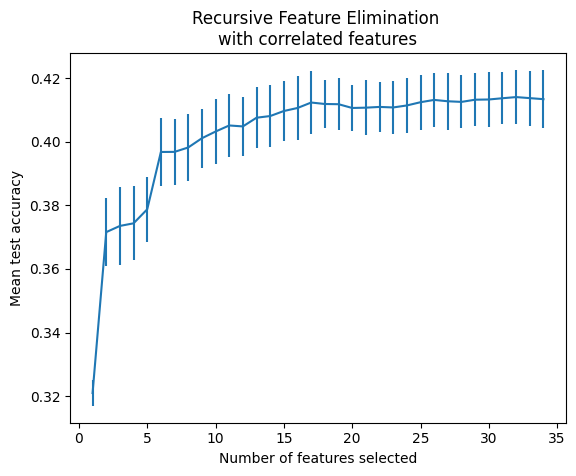

In [65]:
# plot the number of features vs cross-validation

ft_data = {
    key: value
    for key, value in rfecv.cv_results_.items()
    if key in ["n_features", "mean_test_score", "std_test_score"]
}
cv_results = pd.DataFrame(ft_data)
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")
plt.errorbar(
    x=cv_results["n_features"],
    y=cv_results["mean_test_score"],
    yerr=cv_results["std_test_score"],
)
plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()

In [66]:
# optimal features at every step
feat_names = [nm for nm, v in X.items()]

# print(feat_names)

final_set_of_features = set([])

for i in range(cv.n_splits):
    mask = rfecv.cv_results_[f"split{i}_support"][
        rfecv.n_features_ - 1
    ]  # mask of features selected by the RFE
    features_selected = np.ma.compressed(np.ma.masked_array(feat_names, mask=1 - mask))
    print(f"Features selected in fold {i}: {features_selected}")
    print()


Features selected in fold 0: ['popularity' 'acousticness' 'danceability' 'energy' 'instrumentalness'
 'liveness' 'loudness' 'speechiness' 'valence' 'key_A#' 'key_B' 'key_C'
 'key_C#' 'key_D#' 'key_E' 'key_F' 'key_F#' 'key_G#' 'mode_Minor'
 'music_genre_Anime' 'music_genre_Blues' 'music_genre_Classical'
 'music_genre_Country' 'music_genre_Electronic' 'music_genre_Hip-Hop'
 'music_genre_Jazz' 'music_genre_Rap' 'music_genre_Rock' 'duration_min'
 'energy_danceability' 'energy_valence' 'acoustic_instrumental']

Features selected in fold 1: ['popularity' 'acousticness' 'danceability' 'energy' 'instrumentalness'
 'liveness' 'loudness' 'speechiness' 'valence' 'key_A#' 'key_B' 'key_C'
 'key_C#' 'key_D' 'key_D#' 'key_E' 'key_F' 'key_G' 'mode_Minor'
 'music_genre_Anime' 'music_genre_Blues' 'music_genre_Classical'
 'music_genre_Country' 'music_genre_Electronic' 'music_genre_Hip-Hop'
 'music_genre_Jazz' 'music_genre_Rap' 'music_genre_Rock' 'duration_min'
 'energy_danceability' 'energy_valence' 'aco

In [67]:
# select most important features
# Ref: https://www.geeksforgeeks.org/machine-learning/how-to-identify-the-most-informative-features-for-scikit-learn-classifiers/
selected_features = rfecv.support_
final_set_of_features = [feat_names[i] for i in range(len(feat_names)) if selected_features[i]]
print(f"Selected features : {final_set_of_features}")


Selected features : ['popularity', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'valence', 'key_A#', 'key_C', 'key_C#', 'key_D#', 'key_E', 'key_F', 'key_F#', 'key_G', 'key_G#', 'mode_Minor', 'music_genre_Anime', 'music_genre_Blues', 'music_genre_Classical', 'music_genre_Country', 'music_genre_Electronic', 'music_genre_Hip-Hop', 'music_genre_Jazz', 'music_genre_Rap', 'music_genre_Rock', 'duration_min', 'energy_danceability', 'energy_valence', 'acoustic_instrumental']


## Create pipeline and fit models


In [68]:
# cross validation
cross_validation = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=_RANDOM_STATE
)

In [69]:
# data for only selected features
X_train_selected = X_train_scaled[final_set_of_features]
X_test_selected =X_test_scaled[final_set_of_features]


In [70]:
model_map = {
    "Nearest Neighbors": KNeighborsClassifier(_NN_count),  # KNN with 5 neighbours
    "Linear SVM": SVC(kernel="linear", C=0.025, random_state=_RANDOM_STATE),
    # "Logistic Regression": LogisticRegression(),
    # "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(max_depth=_NN_count, random_state=_RANDOM_STATE),
    "Random Forest": RandomForestClassifier(
        max_depth=_NN_count, n_estimators=10, max_features=1, random_state=_RANDOM_STATE
    ),  # ensemble method
    "Neural Net":  MLPClassifier(alpha=1, max_iter=400, random_state=_RANDOM_STATE),  # neural net
}

# with feature selection
# plot confusion matrix

Without Feature Selection: Trained model: Nearest Neighbors
Without Feature Selection: Nearest Neighbors : 34.76
Accuracy: 0.34764287595470106
Confusion Matrix:

[[831 439 395 284   0]
 [595 488 320 310   0]
 [549 347 702 329   0]
 [526 417 404 619   0]
 [  8   6   6  19   0]]
              precision    recall  f1-score   support

           0       0.33      0.43      0.37      1949
           1       0.29      0.28      0.29      1713
           2       0.38      0.36      0.37      1927
           3       0.40      0.31      0.35      1966
           4       0.00      0.00      0.00        39

    accuracy                           0.35      7594
   macro avg       0.28      0.28      0.28      7594
weighted avg       0.35      0.35      0.35      7594

--------------------------------------------------------
Without Feature Selection: Trained model: Linear SVM
Without Feature Selection: Linear SVM : 40.91
Accuracy: 0.40913879378456675
Confusion Matrix:

[[ 777  408  374  390    0]


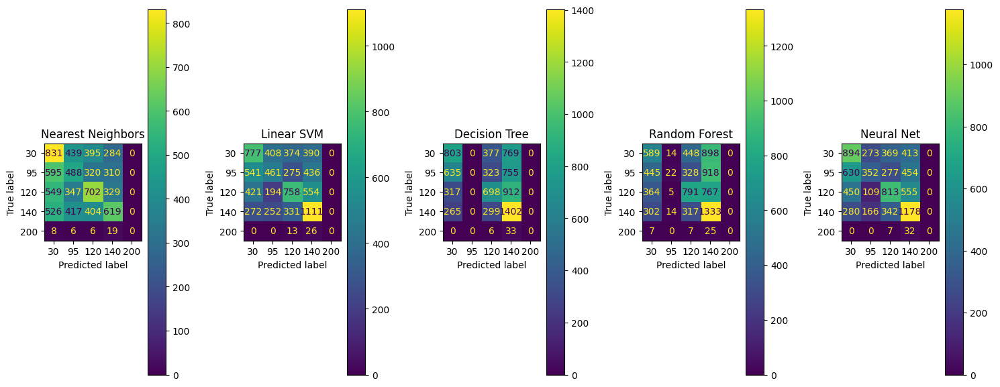

In [71]:
# without feature selection

fig, axes = plt.subplots(nrows=1, ncols=len(model_map), figsize=(15,10))

# print(axes)
# confusion_mat_wo_ft_selection = {}
col = 0
for model_name, model in model_map.items():
    model.fit(X_train, y_train)
    print(f"Without Feature Selection: Trained model: {model_name}")
    print(f"Without Feature Selection: {model_name} : {round(model.score(X_test, y_test) * 100, 2)}")

    predicted_y = model.predict(X_test)
    print("Accuracy:", accuracy_score(y_test, predicted_y))

    cm = confusion_matrix(y_test, predicted_y)
    print("Confusion Matrix:\n")
    print(cm)
    print(classification_report(y_test, predicted_y))
    print("--------------------------------------------------------")

    ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=tempo_bins).plot(ax=axes[col])
    axes[col].set_title(f"{model_name}")
    col += 1

plt.tight_layout()
plt.show()


Scaled data: Trained model: Nearest Neighbors
Scaled data: Nearest Neighbors : 34.76
--------------------------------------------------------
Accuracy: 0.34764287595470106
Confusion Matrix:

[[831 439 395 284   0]
 [595 488 320 310   0]
 [549 347 702 329   0]
 [526 417 404 619   0]
 [  8   6   6  19   0]]
              precision    recall  f1-score   support

           0       0.33      0.43      0.37      1949
           1       0.29      0.28      0.29      1713
           2       0.38      0.36      0.37      1927
           3       0.40      0.31      0.35      1966
           4       0.00      0.00      0.00        39

    accuracy                           0.35      7594
   macro avg       0.28      0.28      0.28      7594
weighted avg       0.35      0.35      0.35      7594

--------------------------------------------------------
Scaled data: Trained model: Linear SVM
Scaled data: Linear SVM : 40.91
--------------------------------------------------------
Accuracy: 0.4091387

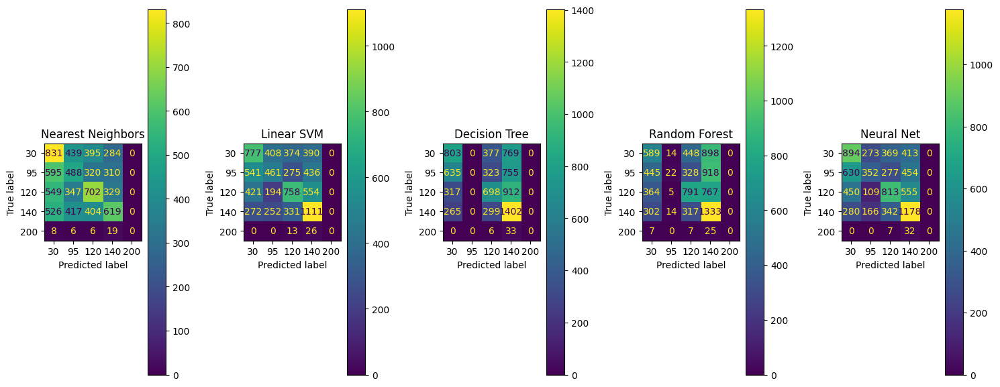

In [72]:
# fit, prdict, score scaled data
fig, axes = plt.subplots(nrows=1, ncols=len(model_map), figsize=(15,10))

col = 0
for model_name, model in model_map.items():
    model.fit(X_train_scaled, y_train)
    print(f"Scaled data: Trained model: {model_name}")
    print(f"Scaled data: {model_name} : {round(model.score(X_test_scaled, y_test) * 100, 2)}")
    print("--------------------------------------------------------")

    predicted_y = model.predict(X_test_scaled)
    print("Accuracy:", accuracy_score(y_test, predicted_y))

    cm = confusion_matrix(y_test, predicted_y)
    print("Confusion Matrix:\n")
    print(cm)
    print(classification_report(y_test, predicted_y))
    print("--------------------------------------------------------")

    ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=tempo_bins).plot(ax=axes[col])
    axes[col].set_title(f"{model_name}")
    col += 1

plt.tight_layout()
plt.show()

Feature Selection: Trained model: Nearest Neighbors
Feature Selection: Nearest Neighbors : 35.25
--------------------------------------------------------
Accuracy: 0.35251514353436925
Confusion Matrix:

[[847 452 375 275   0]
 [599 499 314 301   0]
 [561 335 690 341   0]
 [510 407 408 641   0]
 [ 10   6   6  17   0]]
              precision    recall  f1-score   support

           0       0.34      0.43      0.38      1949
           1       0.29      0.29      0.29      1713
           2       0.38      0.36      0.37      1927
           3       0.41      0.33      0.36      1966
           4       0.00      0.00      0.00        39

    accuracy                           0.35      7594
   macro avg       0.28      0.28      0.28      7594
weighted avg       0.36      0.35      0.35      7594

--------------------------------------------------------
Feature Selection: Trained model: Linear SVM
Feature Selection: Linear SVM : 40.93
----------------------------------------------------

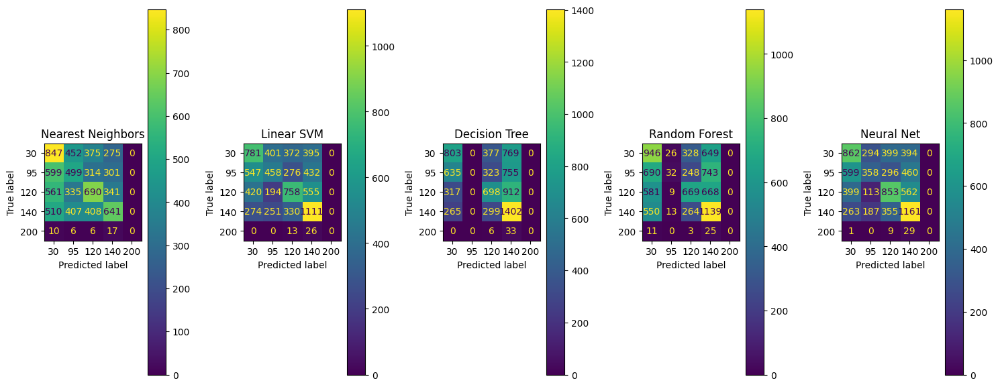

In [73]:
fig, axes = plt.subplots(nrows=1, ncols=len(model_map), figsize=(15,10))

col = 0
for model_name, model in model_map.items():
    model.fit(X_train_selected, y_train)
    print(f"Feature Selection: Trained model: {model_name}")
    print(f"Feature Selection: {model_name} : {round(model.score(X_test_selected, y_test) * 100, 2)}")
    print("--------------------------------------------------------")

    predicted_y = model.predict(X_test_selected)
    print("Accuracy:", accuracy_score(y_test, predicted_y))

    cm = confusion_matrix(y_test, predicted_y)
    print("Confusion Matrix:\n")
    print(cm)
    print(classification_report(y_test, predicted_y))
    print("--------------------------------------------------------")

    ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=tempo_bins).plot(ax=axes[col])
    axes[col].set_title(f"{model_name}")
    col += 1

plt.tight_layout()
plt.show()

### Observation
- scaled data did not perform any better than non-scaled
- feature selection did not do significantly better than non-selected
- Linear SVM and Neural Net are the best ones
- Random forest did minimally better than Decision Tree

In [74]:
## Folds, Linear SVM, Selected Feature
# Ref: https://apxml.com/courses/getting-started-with-scikit-learn/chapter-5-model-selection-evaluation/stratified-kfold-classification
from sklearn.model_selection import cross_val_score

kfolds = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=_RANDOM_STATE
)
# for train_index, test_index in kfolds.split(X_train_selected, y_train):
#     # print(f"Fold {i}:")
#     print(f"  Train: index={train_index} :: len={len(train_index)}")
#     print(f"  Test:  index={test_index} :: len={len(test_index)}")

#     print("***************")
svc = SVC(kernel="linear", C=0.025, random_state=_RANDOM_STATE)
scores_explicit_skf = cross_val_score(svc, X_train_selected, y_train, cv=kfolds, scoring='accuracy')
print(f"\nAccuracy scores using explicit StratifiedKFold (5-fold): {scores_explicit_skf}")
print(f"Mean Accuracy: {scores_explicit_skf.mean():.4f} (+/- {scores_explicit_skf.std() * 2:.4f})")



Accuracy scores using explicit StratifiedKFold (5-fold): [0.4054321  0.4126749  0.4108642  0.41455384 0.41422456]
Mean Accuracy: 0.4115 (+/- 0.0067)


In [75]:
# Folds, NN, Selected Feature
mlp = MLPClassifier(alpha=1, max_iter=400, random_state=_RANDOM_STATE)
scores_explicit_skf = cross_val_score(mlp, X_train_selected, y_train, cv=kfolds, scoring='accuracy')
print(f"\nAccuracy scores using explicit StratifiedKFold (5-fold): {scores_explicit_skf}")
print(f"Mean Accuracy: {scores_explicit_skf.mean():.4f} (+/- {scores_explicit_skf.std() * 2:.4f})")



Accuracy scores using explicit StratifiedKFold (5-fold): [0.42419753 0.44246914 0.4327572  0.43035891 0.42426737]
Mean Accuracy: 0.4308 (+/- 0.0135)


In [76]:
# Hyper Parameter tuning
# Define the parameter grid

### This did not complete in 20 hours, so commenting is  for now

# param_grid = {
#     'C': [0.1, 1, 10, 100],
#     'gamma': [1, 0.1, 0.01, 0.001],
#     'kernel': ['rbf', 'linear']
# }
#
# gscv = GridSearchCV(
#     estimator=svc,
#     # scoring="accuracy",
#     param_grid=param_grid,
#     refit=True,
#     verbose=1,
#     cv=5,
#     n_jobs=1
# )
#
# # Fit the model (it will try all combinations)
# gscv.fit(X_train_selected, y_train)
#
# print(f"Best Parameters: {gscv.best_params_}")
# print(f"Best Score: {gscv.best_score_}")
#
# # You can now use the 'grid' object to predict, as it has been refit with the best settings
# predicted_y = gscv.predict(X_test_selected)
#
# print(f"Feature Selection: Trained model: SVC : Selected Features: 5-folds: Tuned parameters")
# print(f"Score: {round(gscv.score(X_test_selected, y_test) * 100, 2)}")
# print("--------------------------------------------------------")
#
# print("Accuracy:", accuracy_score(y_test, predicted_y))
#
# cm = confusion_matrix(y_test, predicted_y)
# print("Confusion Matrix:\n")
# print(cm)
# print(classification_report(y_test, predicted_y))
# print("--------------------------------------------------------")
#
# fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15,10))
#
# ConfusionMatrixDisplay(
#     confusion_matrix=cm,
#     display_labels=gscv.classes_).plot(ax=axes[0])
# axes[0].set_title("SVC : Selected Features: 5-folds: Tuned parameters")
#
# plt.tight_layout()
# plt.show()


In [77]:
# Parameter tuning via RandomizedSearchCV
# Ref: https://medium.com/@aditib259/a-comprehensive-guide-to-hyperparameter-tuning-in-machine-learning-dd9bb8072d02

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Define hyperparameters with a range of values
param_dist = {
    'n_estimators': randint(10, 200),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 11)
}

# Initialize model
rf = RandomForestClassifier()

# Perform Randomized Search
random_search = RandomizedSearchCV(rf, param_dist, n_iter=10, cv=5, scoring='accuracy', n_jobs=-1, random_state=42)
random_search.fit(X_train_selected, y_train)

print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Parameters: {'max_depth': 20, 'min_samples_split': 9, 'n_estimators': 198}
Best Score: 0.4494777849594372


Score: 44.59
--------------------------------------------------------
Accuracy: 0.44587832499341584
Confusion Matrix:

[[ 905  297  403  344    0]
 [ 555  429  313  416    0]
 [ 397  132  919  479    0]
 [ 276  187  370 1133    0]
 [   1    0    9   29    0]]
              precision    recall  f1-score   support

           0       0.42      0.46      0.44      1949
           1       0.41      0.25      0.31      1713
           2       0.46      0.48      0.47      1927
           3       0.47      0.58      0.52      1966
           4       0.00      0.00      0.00        39

    accuracy                           0.45      7594
   macro avg       0.35      0.35      0.35      7594
weighted avg       0.44      0.45      0.44      7594

--------------------------------------------------------


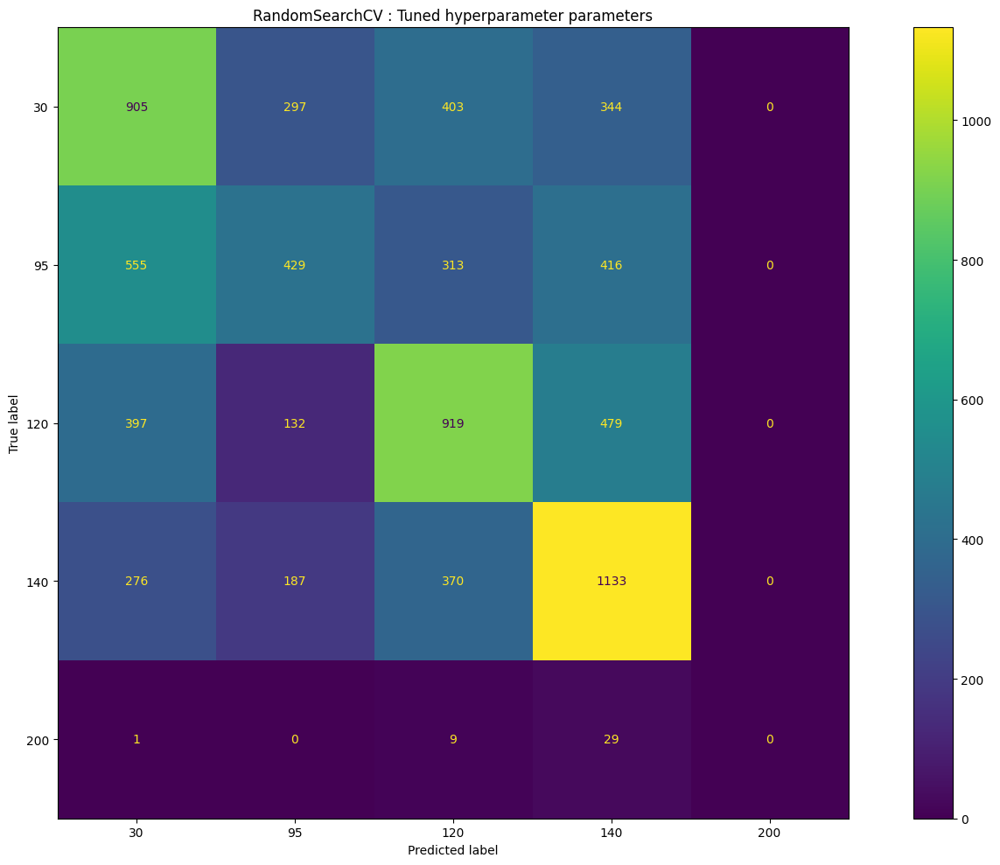

In [78]:
# plot
predicted_y = random_search.predict(X_test_selected)

# print(f"Feature Selection: Trained model: SVC : Selected Features: 5-folds: Tuned parameters")
print(f"Score: {round(random_search.score(X_test_selected, y_test) * 100, 2)}")
print("--------------------------------------------------------")

print("Accuracy:", accuracy_score(y_test, predicted_y))

cm = confusion_matrix(y_test, predicted_y)
print("Confusion Matrix:\n")
print(cm)
print(classification_report(y_test, predicted_y))
print("--------------------------------------------------------")

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15,10))

# print(axes)
ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=tempo_bins).plot(ax=axes)
axes.set_title("RandomSearchCV : Tuned hyperparameter parameters")

plt.tight_layout()
plt.show()

In [79]:
# extract the tuned parameters
# Print the best parameters found
print("Best Model: ", random_search.best_estimator_)
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Model:  RandomForestClassifier(max_depth=20, min_samples_split=9, n_estimators=198)
Best Parameters: {'max_depth': 20, 'min_samples_split': 9, 'n_estimators': 198}
Best Score: 0.4494777849594372


In [80]:
# go through NN and RandomForest
from scipy.stats import randint, uniform

para_tuning_pipe = Pipeline([('clf', RandomForestClassifier())])

# parameters for tuning for different model
param_distributions = [
    {
        'clf': [RandomForestClassifier()],
        'clf__n_estimators': randint(10, 200),
        'clf__max_depth': [None, 10, 20, 30],
        'clf__min_samples_split': randint(2, 11)
    },
    {
        'clf': [MLPClassifier(alpha=1, max_iter=400, random_state=_RANDOM_STATE)],
        'clf__hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
        'clf__activation': ['tanh', 'relu'],
        'clf__solver': ['sgd', 'adam'],
        'clf__alpha': uniform(0.0001, 0.05), # Continuous distribution
        'clf__learning_rate_init': uniform(0.001, 0.01),
        'clf__max_iter': [200, 300]
    }
]

random_search = RandomizedSearchCV(para_tuning_pipe, param_distributions, n_iter=10, cv=5, scoring='accuracy', n_jobs=-1)
random_search.fit(X_train_selected, y_train)


,"estimator estimator: estimator objectAn object of that type is instantiated for each grid point.This is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.",Pipeline(step...lassifier())])
,"param_distributions param_distributions: dict or list of dictsDictionary with parameters names (`str`) as keys and distributionsor lists of parameters to try. Distributions must provide a ``rvs``method for sampling (such as those from scipy.stats.distributions).If a list is given, it is sampled uniformly.If a list of dicts is given, first a dict is sampled uniformly, andthen a parameter is sampled using that dict as above.","[{'clf': [RandomForestClassifier()], 'clf__max_depth': [None, 10, ...], 'clf__min_samples_split': <scipy.stats....t 0x11d47a3f0>, 'clf__n_estimators': <scipy.stats....t 0x11ea98690>}, {'clf': [MLPClassifier...ndom_state=42)], 'clf__activation': ['tanh', 'relu'], 'clf__alpha': <scipy.stats....t 0x11ea53620>, 'clf__hidden_layer_sizes': [(50,), (100,), ...], ...}]"
,"n_iter n_iter: int, default=10Number of parameter settings that are sampled. n_iter tradesoff runtime vs quality of the solution.",10
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.If None, the estimator's score method is used.",'accuracy'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given the ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``RandomizedSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is use

In [81]:
# Print the best parameters found
print("Best Model: ", random_search.best_estimator_)
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Model:  Pipeline(steps=[('clf',
                 RandomForestClassifier(min_samples_split=10,
                                        n_estimators=194))])
Best Parameters: {'clf': RandomForestClassifier(), 'clf__max_depth': None, 'clf__min_samples_split': 10, 'clf__n_estimators': 194}
Best Score: 0.44802925780937713


In [82]:
# fit the best model again, with best parameters
best_model = random_search.best_estimator_
best_predicted_y = best_model.predict(X_test_selected)

print(f"Score: {round(random_search.score(X_test_selected, y_test) * 100, 2)}")
print("--------------------------------------------------------")
print("Accuracy:", accuracy_score(y_test, best_predicted_y))

cm = confusion_matrix(y_test, best_predicted_y)
print("Confusion Matrix:\n")
print(cm)
print(classification_report(y_test, best_predicted_y))
print("--------------------------------------------------------")

Score: 44.88
--------------------------------------------------------
Accuracy: 0.44877534895970506
Confusion Matrix:

[[ 929  300  384  336    0]
 [ 576  435  292  410    0]
 [ 388  142  913  484    0]
 [ 275  196  364 1131    0]
 [   1    0    8   30    0]]
              precision    recall  f1-score   support

           0       0.43      0.48      0.45      1949
           1       0.41      0.25      0.31      1713
           2       0.47      0.47      0.47      1927
           3       0.47      0.58      0.52      1966
           4       0.00      0.00      0.00        39

    accuracy                           0.45      7594
   macro avg       0.35      0.36      0.35      7594
weighted avg       0.44      0.45      0.44      7594

--------------------------------------------------------


In [83]:
best_predicted_y

array([2, 3, 1, ..., 0, 2, 3], shape=(7594,))

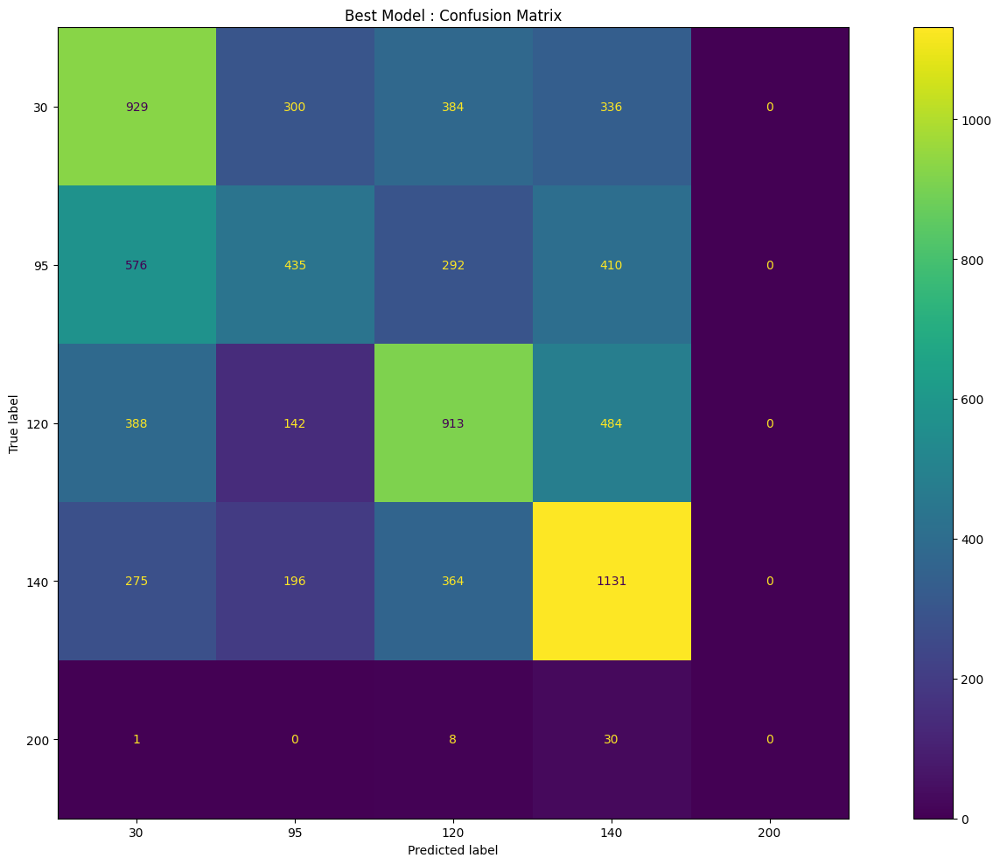

In [84]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15,10))

# print(tempo_labels)
# print(random_search.classes_)
ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=tempo_bins).plot(ax=axes)
axes.set_title("Best Model : Confusion Matrix")

plt.tight_layout()
plt.show()

## Recommendation based on KNN, demonstration



In [85]:
fn = final_set_of_features
cn = pd.Series(_TARGET)
print(best_model['clf'])
# print(best_model['clf'].estimators_)
fig, axes = plt.subplots(nrows = 5, ncols = 5, figsize = (10, 10), dpi=900)

# print(len(best_model['clf'].estimators_))


# row = 0
# col = 0
window = 0
for row in range(0, 5):
    window = row
    for col in range(0, 5):
        index = col + window * 5
        # print(f"{index} : {best_model['clf'].estimators_[index]}")
        plot_tree(
            best_model['clf'].estimators_[index],
            feature_names=fn,
            class_names=True,
            filled=True,
            ax=axes[row][col]
        )

        axes[row][col].set_title('Estimator: ' + str(index), fontsize = 11)
plt.tight_layout()
plt.show()

# fig.savefig('rf_5trees.png')

RandomForestClassifier(min_samples_split=10, n_estimators=194)


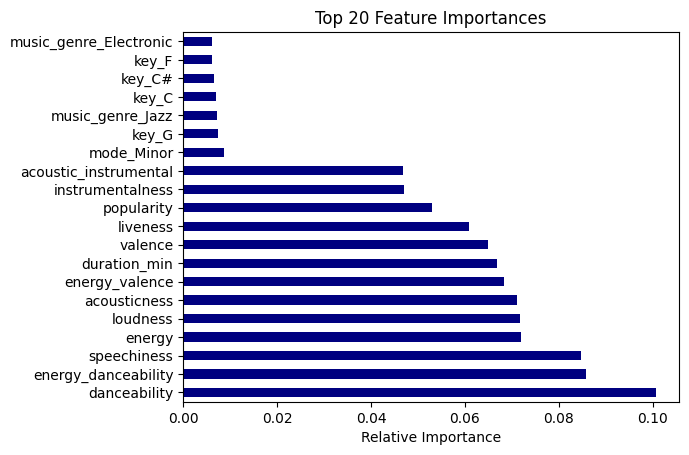

In [86]:
# Get importances and sort them
# print(best_model['clf'].feature_importances_)
importances = pd.Series(best_model['clf'].feature_importances_, index=X_test_selected.columns)
importances.nlargest(20).plot(kind='barh', color='navy')

plt.title('Top 20 Feature Importances')
plt.xlabel('Relative Importance')
plt.show()

In [87]:
# Sample recommendation
import random
print(X_test_selected.shape)
random_idx = random.randint(0, X_test_selected.shape[0])
print(random_idx)
sample_X_reco = X_test_selected.iloc[random_idx-4:random_idx]
sample_X_reco

(7594, 32)
3444


,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,valence,key_A#,...,music_genre_Country,music_genre_Electronic,music_genre_Hip-Hop,music_genre_Jazz,music_genre_Rap,music_genre_Rock,duration_min,energy_danceability,energy_valence,acoustic_instrumental
3972,-0.289318,-0.815766,1.595698,-0.737890,1.991500,-0.770447,-0.071245,-0.384643,1.481859,-0.268189,...,-0.331911,2.967165,-0.347170,-0.340525,-0.288516,-0.345918,0.219201,-0.055250,0.136855,-0.306357
4461,-1.772008,-0.723570,-1.911205,1.081799,-0.573464,-0.140367,0.621581,-0.188522,-0.422602,-0.268189,...,-0.331911,-0.337022,-0.347170,-0.340525,-0.288516,-0.345918,0.464403,-0.858140,0.057123,-0.414936
11271,-0.160388,1.905899,1.014010,-1.839378,2.090964,-0.515341,-2.365157,-0.351110,0.386693,-0.268189,...,-0.331911,-0.337022,-0.347170,2.936646,-0.288516,-0.345918,-1.468137,-1.486059,-1.124246,2.986235
37801,2.998387,0.446367,1.780272,-0.760217,-0.573452,0.634170,0.021312,1.536937,-0.068284,-0.268189,...,-0.331911,-0.337022,2.880435,-0.340525,-0.288516,-0.345918,-1.137687,-0.011753,-0.587189,-0.414929


In [88]:
sample_y_reco = best_model.predict(sample_X_reco)
print(sample_y_reco)

[0 3 2 1]


In [89]:
# transformed_df

for predicted_tempo in sample_y_reco:
    # print(predicted_tempo)
    tempo_tmp = transformed_df.loc[transformed_df["tempo_group"] == tempo_labels[predicted_tempo]]
    random_art_idx = random.randint(0, len(tempo_tmp))
    print(random_art_idx)
    print(tempo_tmp.iloc[random_idx-1:random_idx].artist_name)



7766


AttributeError: 'DataFrame' object has no attribute 'artist_name'